In [2]:
import torch
import torch.nn as nn
import numpy as np
from copy import deepcopy

device = "cuda" if torch.cuda.is_available() else "cpu"

class RBFlayer(nn.Module):
    def __init__(self, timelag):
        super(RBFlayer, self).__init__()

        self.timelag = timelag

        device = "cuda" if torch.cuda.is_available() else "cpu"
        torch.cuda.manual_seed(0)

        self.init_weight_cause = nn.Parameter(torch.rand(self.timelag, device=device))
        self.init_weight_target = nn.Parameter(torch.rand(self.timelag, device=device))
        self.cause_clt = self.init_clt()
        self.cause_std = self.init_clt()
        self.target_clt = nn.Parameter(torch.rand(1, device=device))
        self.target_std = nn.Parameter(torch.rand(1, device=device))
        
        self.b = nn.Parameter(torch.rand(1,device = device))

    def init_clt(self):
        return nn.Parameter(torch.rand(1, device=device))

    def init_std(self):
        return nn.Parameter(torch.rand(1, device=device))

    def rbf(self, x, cluster, std):
        return torch.exp(-(x - cluster) * (x - cluster) / 2 * (std * std))
    
    def rbf_gradient(self, x, clt, std):
        return (-2 * (x - clt) / (std * std)) * (torch.exp(-(x - clt) * (x - clt) / 2 * (std * std)))
    
    def rbf_grad(self, x, type_ = 'cause'):
        
        # 1~ x.shape[0]-2th gradient list
        
        rbf_grad_list = []
        if type_ == "cause":
            for j in range(x.shape[0] - 2):
                rbf_grad_list.append(self.rbf_gradient(x[j+1], self.cause_clt, self.cause_std))
        
        else:
            for j in range(x.shape[0] - 2):
                rbf_grad_list.append(self.rbf_gradient(x[j+1], self.target_clt, self.target_std))
        
        return rbf_grad_list
    
    def rbf_num_grad(self, x, type_ = "cause"):
        
        rbf_grad_list = []
        if type_ == "cause":
            for j in range(x.shape[0] - 2):
                rbf_grad_list.append(self.rbf(x[j+2], self.cause_clt, self.cause_std) - self.rbf(x[j], self.cause_clt, self.cause_std))
                
        else:
            for j in range(x.shape[0] - 2):
                rbf_grad_list.append(self.rbf(x[j+2], self.target_clt, self.target_std) - self.rbf(x[j], self.target_clt, self.target_std))
                
        return rbf_grad_list


    def forward(self, cause, target):

        for i in range(len(cause)):
            if i == 0:
                a = self.rbf(cause[i], self.cause_clt, self.cause_std)
            else:
                a = torch.cat([a, self.rbf(cause[i], self.cause_clt, self.cause_std)], dim=0)
        cause = self.init_weight_cause * a

        for j in range(len(target)):
            if j == 0:
                b = self.rbf(target[j], self.target_clt, self.target_std)
            else:
                b = torch.cat([b, self.rbf(target[j], self.target_clt, self.target_std)], dim=0)
        target = self.init_weight_target * b
        
        pred = sum(cause) + sum(target) + self.b

        return cause, target, pred

In [3]:
class RBFnet(nn.Module):
    def __init__(self, input_size , output_size, timelag):
        super(RBFnet,self).__init__()

        self.input_size = input_size      # number of data
        self.output_size = output_size
        self.timelag = timelag

        self.linear = nn.ModuleList([nn.Linear(self.timelag*2,1) for _ in range(self.input_size)])
        self.relu = nn.ReLU()
        self.networks = nn.ModuleList([RBFlayer(self.timelag) for _ in range(self.input_size)])

    def cause_target(self, cause, target):
        x = torch.cat((cause, target), 0)

        return x

    def GC(self, threshold=True):
        '''
        Extract learned Granger causality.
        Args:
          threshold: return norm of weights, or whether norm is nonzero.
        Returns:
          GC: (p x p) matrix. Entry (i, j) indicates whether variable j is
            Granger causal of variable i.
        '''
        GC = [torch.norm(net.init_weight_cause, dim=0)
              for net in self.networks]
        GC = torch.stack(GC)
        if threshold:
            return (GC > 0).int()
        else:
            return GC


    def forward(self, causes, targets):
        out_list = []
        cause_list = []
        target_list = []
        for i in range(self.input_size):
            cause, target, pred = self.networks[i](causes[i], targets[i])
            # cause, target, pred = self.relu(cause), self.relu(target)
            # pred = torch.cat((cause, target),0)
            # pred = self.linear[i](pred)
            out_list.append(pred)
            cause_list.append(cause)
            target_list.append(target)

        return out_list, cause_list, target_list

In [4]:
def restore_parameters(model, best_model):
    '''Move parameter values from best_model to model.'''
    for params, best_params in zip(model.parameters(), best_model.parameters()):
        params.data = best_params

def train_rbf(model, input_causes, input_targets, Y, lr, epochs, lookback=5,device = device):
    # input_causes, input_targets : X
    # Y : Y
    model.to(device)
    loss_fn = nn.MSELoss(reduction='mean')
    optimizer = torch.optim.Adam(model.parameters(), lr=lr)
    train_loss_list = []

    best_it = None
    best_model = None
    best_loss = np.inf
    time = torch.tensor([0,1,2,3,4,5,6,7,8,9], device = device)
    pred_list = []
    for epoch in range(epochs):
        
        
        # pred loss
        
        pred, cause_list, target_list = model(input_causes, input_targets)
        pred_list.append(pred)
        '''
        loss_ = sum([loss_fn(pred[i], Y[i]) for i in range(len(Y))])
        '''
        '''
        # cause gradient loss
        for i in range(len(model.networks)):
            rbf_num_list = model.networks[i].rbf_num_grad(time, "cause")
            rbf_fn_grad = model.networks[i].rbf_grad(time, "cause")
            
            loss_cause += sum([loss_fn(rbf_fn_grad[j], rbf_num_list[j]) for j in range(len(rbf_num_list))])
        
        # target gradient loss
        for i in range(len(model.networks)):
            rbf_num_list = model.networks[i].rbf_num_grad(time, "target")
            rbf_fn_grad = model.networks[i].rbf_grad(time, "target")
            
            loss_target += sum([loss_fn(rbf_fn_grad[j], rbf_num_list[j]) for j in range(len(rbf_num_list))])
        '''
        
        loss_ = sum([loss_fn(cause_list[i], input_cause[i]) for i in range(len(input_cause))])
        loss_2 = sum([loss_fn(target_list[i], input_target[i]) for i in range(len(input_cause))])

              
        # loss = loss_target
        '''
        loss_.backward()
        optimizer.step()
        
        loss_cause.backward()
        optimizer.step()
        
        loss_target.backward()
        optimizer.step()
        '''
        loss = loss_ + loss_2 
        print("epoch {} cause loss {} :".format(epoch, loss_ / len(Y)))
        print("epoch {} target loss {} :".format(epoch, loss_2 / len(Y)))
        print("------------------------------------------------------")
        print()
        loss.backward()
        optimizer.step()
        model.zero_grad()

        
        mean_loss = loss / len(Y)
        train_loss_list.append(mean_loss)
        if mean_loss < best_loss:
            best_loss = mean_loss
            best_it = epoch
            best_model = deepcopy(model)
        elif (epoch - best_it) == lookback:
            if verbose:
                print('Stopping early')
            break

    restore_parameters(model, best_model)

    return train_loss_list , model, cause_list, target_list, pred_list

In [1]:
def data_split(X, cause, target, timelag, device = device):
    input_cause = []
    input_target = []
    Y = []

    for i in range(len(X) - (timelag + 1)):
        input_cause.append(X[cause].values[i: i + timelag])
        input_target.append(X[target].values[i: i + timelag])
        Y.append([X[target][i + timelag + 1]])

    return torch.tensor(input_cause, device=device).float(), torch.tensor(input_target,device=device).float(), torch.tensor(Y, device=device).float()


NameError: name 'device' is not defined

In [6]:
import pandas as pd
df = pd.read_csv('C:/Users/chanyoung/Desktop/Neural-GC-master/lorenz_96_10_10_1000.csv')
X2d = df[['a','b']]
torch.manual_seed(1234)
input_cause, input_target, Y = data_split(X2d, 'a', 'b', 10)

In [7]:
input_cause

tensor([[ 0.0990,  2.3833,  6.1237,  ...,  0.7887, -3.0315, -3.0010],
        [ 2.3833,  6.1237,  8.7908,  ..., -3.0315, -3.0010, -1.9771],
        [ 6.1237,  8.7908,  8.6702,  ..., -3.0010, -1.9771, -1.6429],
        ...,
        [ 2.5767,  3.8119,  5.3918,  ...,  1.1669, -0.7102, -2.3594],
        [ 3.8119,  5.3918,  6.0065,  ..., -0.7102, -2.3594, -2.1374],
        [ 5.3918,  6.0065,  5.1861,  ..., -2.3594, -2.1374, -0.8038]],
       device='cuda:0')

In [ ]:
model = RBFnet(input_cause.size()[0], 1, input_cause.size()[1])
print(model.networks[1].init_weight_cause)
print(model.networks[1].cause_std)
print(model.networks[1].target_std)
loss, best_model, cause_list, target_list, pred_list = train_rbf(model, input_cause, input_target, Y, 0.01, 200, device)
print(best_model.networks[1].init_weight_cause)
print(best_model.networks[1].cause_std)
print(model.networks[1].target_std)

Parameter containing:
tensor([0.3990, 0.5167, 0.0249, 0.9401, 0.9459, 0.7967, 0.4150, 0.8203, 0.2290,
        0.9096], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([0.7874], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([0.4503], device='cuda:0', requires_grad=True)
epoch 0 cause loss 23.91799545288086 :
epoch 0 target loss 27.082441329956055 :
------------------------------------------------------

epoch 1 cause loss 23.906518936157227 :
epoch 1 target loss 27.050439834594727 :
------------------------------------------------------

epoch 2 cause loss 23.894983291625977 :
epoch 2 target loss 27.01706886291504 :
------------------------------------------------------

epoch 3 cause loss 23.883312225341797 :
epoch 3 target loss 26.982202529907227 :
------------------------------------------------------

epoch 4 cause loss 23.87152671813965 :
epoch 4 target loss 26.945571899414062 :
------------------------------------------------------

epoch 5 ca

epoch 58 cause loss 18.996566772460938 :
epoch 58 target loss 20.672483444213867 :
------------------------------------------------------

epoch 59 cause loss 18.82917022705078 :
epoch 59 target loss 20.580238342285156 :
------------------------------------------------------

epoch 60 cause loss 18.694461822509766 :
epoch 60 target loss 20.490022659301758 :
------------------------------------------------------

epoch 61 cause loss 18.590559005737305 :
epoch 61 target loss 20.4008846282959 :
------------------------------------------------------

epoch 62 cause loss 18.51156234741211 :
epoch 62 target loss 20.31192970275879 :
------------------------------------------------------

epoch 63 cause loss 18.4488468170166 :
epoch 63 target loss 20.222562789916992 :
------------------------------------------------------

epoch 64 cause loss 18.393396377563477 :
epoch 64 target loss 20.132526397705078 :
------------------------------------------------------

epoch 65 cause loss 18.33761596679

epoch 118 cause loss 13.909804344177246 :
epoch 118 target loss 16.06443214416504 :
------------------------------------------------------

epoch 119 cause loss 13.84422492980957 :
epoch 119 target loss 16.001934051513672 :
------------------------------------------------------

epoch 120 cause loss 13.778661727905273 :
epoch 120 target loss 15.939848899841309 :
------------------------------------------------------

epoch 121 cause loss 13.713074684143066 :
epoch 121 target loss 15.877948760986328 :
------------------------------------------------------

epoch 122 cause loss 13.647485733032227 :
epoch 122 target loss 15.816197395324707 :
------------------------------------------------------

epoch 123 cause loss 13.581978797912598 :
epoch 123 target loss 15.754645347595215 :
------------------------------------------------------

epoch 124 cause loss 13.516679763793945 :
epoch 124 target loss 15.693324089050293 :
------------------------------------------------------

epoch 125 cause

epoch 177 cause loss 10.762077331542969 :
epoch 177 target loss 12.844313621520996 :
------------------------------------------------------

epoch 178 cause loss 10.719355583190918 :
epoch 178 target loss 12.79731559753418 :
------------------------------------------------------

epoch 179 cause loss 10.676679611206055 :
epoch 179 target loss 12.750626564025879 :
------------------------------------------------------

epoch 180 cause loss 10.634081840515137 :
epoch 180 target loss 12.704166412353516 :
------------------------------------------------------

epoch 181 cause loss 10.591666221618652 :
epoch 181 target loss 12.65788459777832 :
------------------------------------------------------

epoch 182 cause loss 10.549494743347168 :
epoch 182 target loss 12.611732482910156 :
------------------------------------------------------

epoch 183 cause loss 10.507536888122559 :
epoch 183 target loss 12.565666198730469 :
------------------------------------------------------

epoch 184 cause

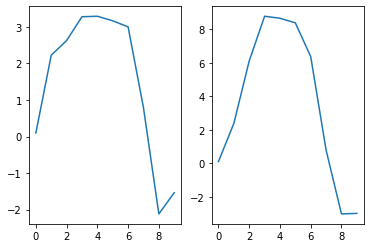

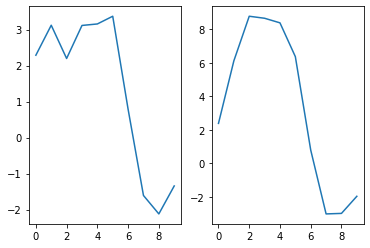

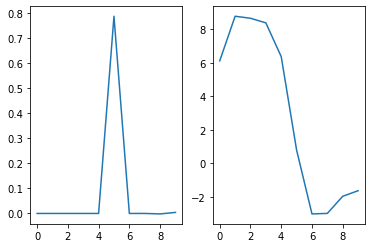

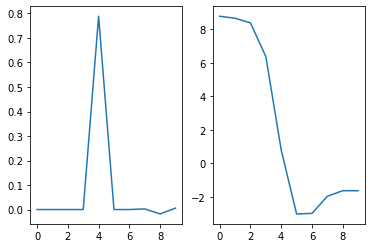

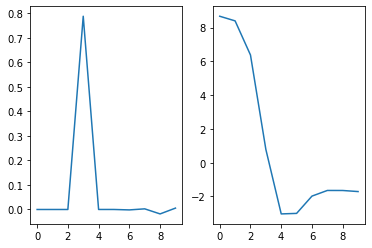

...

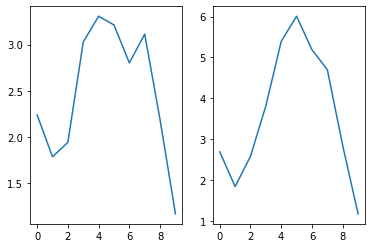

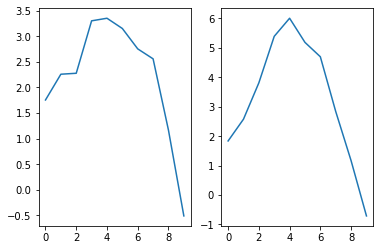

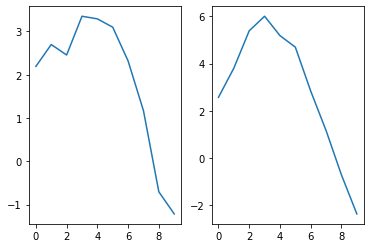

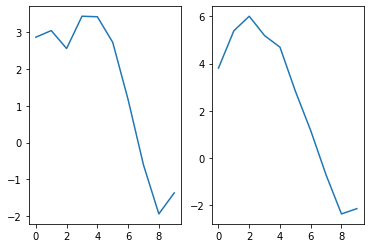

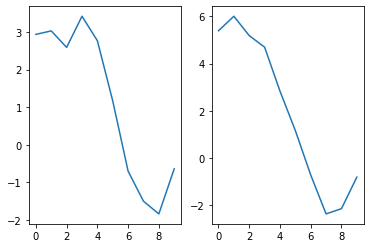

In [7]:
import matplotlib.pyplot as plt
for i in range(len(input_cause)):
    plt.subplot(121)
    plt.plot(cause_list[i].cpu().detach().numpy())
    plt.subplot(122)
    plt.plot(input_cause[i].cpu().detach().numpy())
    plt.show()

In [13]:
loss_fn = nn.MSELoss(reduction='mean')
print((sum([loss_fn(Y[i], pred_list[199][i]) for i in range(len(pred_list[199]))])) / len(pred_list[199]))

tensor(742.5650, device='cuda:0', grad_fn=<DivBackward0>)


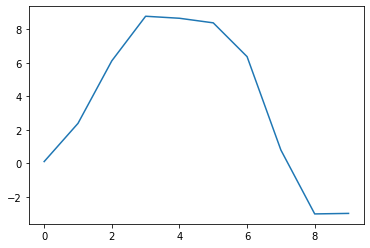

In [35]:
plt.plot(input_cause[0].cpu().detach().numpy())
plt.show()

In [20]:
a = best_model.networks[0].cause_clt

In [21]:
b = best_model.networks[0].cause_std

In [18]:
input_cause[0]

tensor([ 0.0990,  2.3833,  6.1237,  8.7908,  8.6702,  8.3957,  6.3754,  0.7887,
        -3.0315, -3.0010], device='cuda:0')

In [17]:
def rbf(x, cluster, std):
    return torch.exp(-(x - cluster) * (x - cluster) / 2 * (std * std))

In [24]:
rbf_0 = rbf(input_cause[0], a, b)

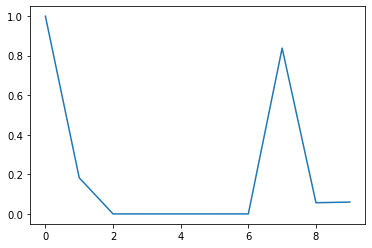

In [25]:
plt.plot(rbf_0.cpu().detach().numpy())
plt.show()